In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from more_itertools import flatten
%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
from dhdrnet.util import ROOT_DIR
data_dir = ROOT_DIR / "precomputed_data"
figdir = ROOT_DIR / "figures" / "ev_choices" / "ev_correct"
plt.rcParams['figure.figsize'] = (10,10)

In [36]:
df = (
        pd.read_csv(data_dir / "store_finer_2020-07-04.csv", usecols=["name", "metric", "score", "ev1", "ev2"])
        .set_index("name")
        .sort_index()
     )
df

,metric,ev1,ev2,score
name,,,,
0006_20160721_163256_525,ssim,4.00,4.25,0.484424
0006_20160721_163256_525,ssim,-1.75,0.50,0.966806
0006_20160721_163256_525,perceptual,-1.75,0.50,0.048038
0006_20160721_163256_525,mse,-1.75,0.75,118.336332
0006_20160721_163256_525,ssim,-1.75,0.75,0.974861
...,...,...,...,...
synthetic_ramp_night_motion_blur,mse,-1.75,0.75,1257.187420
synthetic_ramp_night_motion_blur,perceptual,-1.75,0.50,0.134632
synthetic_ramp_night_motion_blur,ssim,-1.75,0.50,0.879882


### prepare data, set index to the names, group by metric, clean

In [24]:
df[["ev1", "ev2"]] = df[["ev1", "ev2"]].astype("float")

In [25]:
bdf = df[(df["ev1"] == 0) | (df["ev2"] == 0)].copy()
bdf["ev"] = bdf[["ev1","ev2"]].apply(lambda evs: [ev for ev in evs if ev != 0][0],axis=1)
bdf = bdf.drop(columns=["ev1", "ev2"])
bdf

,metric,score,ev
name,,,
0006_20160721_163256_525,mse,634.889757,-1.75
0006_20160721_163256_525,ssim,0.934373,-1.75
0006_20160721_163256_525,perceptual,0.067679,-1.75
0006_20160721_163256_525,mse,722.200191,-2.00
0006_20160721_163256_525,ssim,0.930313,-2.00
...,...,...,...
synthetic_ramp_night_motion_blur,ssim,0.732060,-2.00
synthetic_ramp_night_motion_blur,mse,4991.714792,-2.00
synthetic_ramp_night_motion_blur,perceptual,0.252432,-1.75


In [26]:
evdf = df.copy()
df["ev"] = df[["ev1", "ev2"]].apply(lambda df: tuple(sorted(df)), axis=1)
df = df.drop(["ev1", "ev2"],axis=1)
dfg = df.groupby("metric")

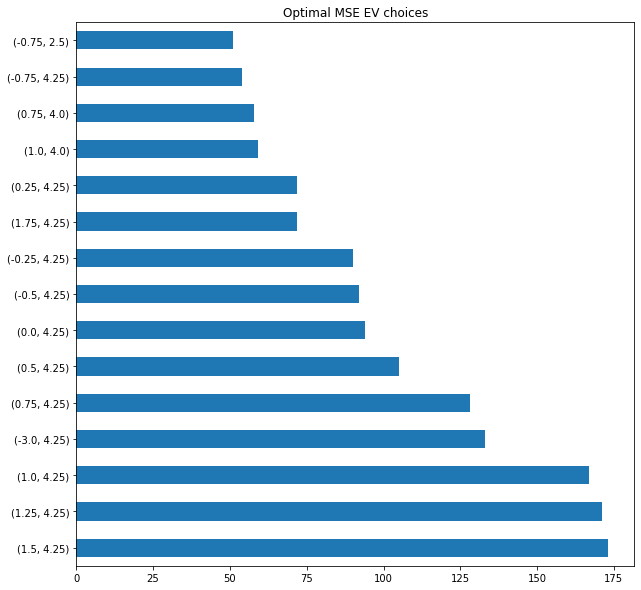

In [27]:
mse_df = dfg.get_group("mse").drop("metric",axis=1)
mse_mins = mse_df.pivot(columns="ev").idxmin(axis=1).apply(lambda f: f[1])
mse_mins.value_counts().iloc[:15].plot.barh(title="Optimal MSE EV choices")
# plt.savefig(figdir / "optimal_mse_ev_corrected")

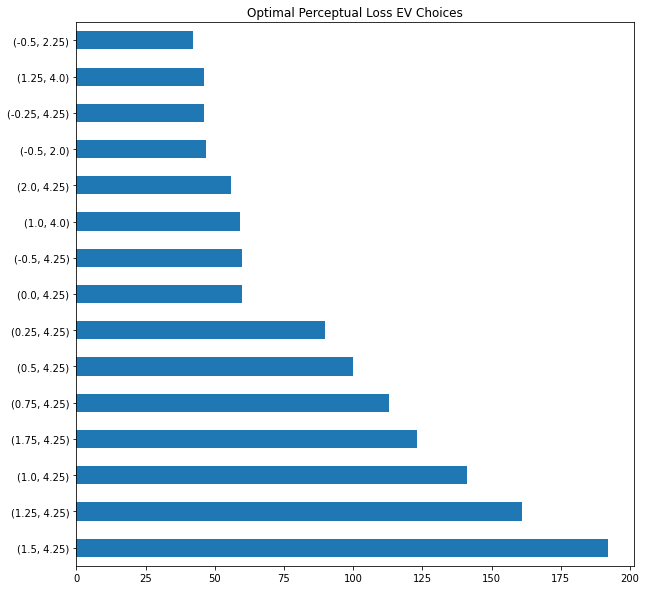

In [28]:
perc_df = dfg.get_group("perceptual").drop(columns="metric")
perc_mins = perc_df.pivot(columns="ev").idxmin(axis=1).apply(lambda f: f[1])
perc_mins.value_counts().iloc[:15].plot.barh(title="Optimal Perceptual Loss EV Choices")

# plt.savefig(figdir / "optimal_perceptual_ev_corrected")

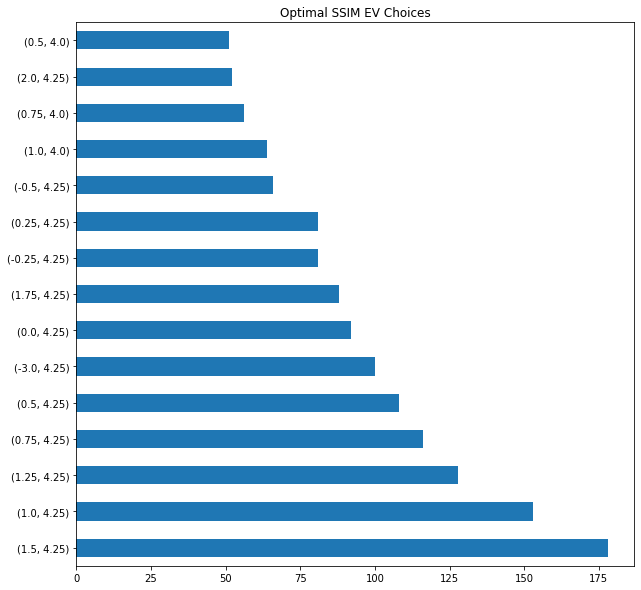

In [29]:
ssim_df = dfg.get_group("ssim").drop(columns="metric").copy()
ssim_df["score"] = 1 - ssim_df["score"]
ssim_mins = ssim_df.pivot(columns="ev").idxmin(axis=1).apply(lambda f: f[1])
ssim_mins.value_counts().iloc[:15].plot.barh(title="Optimal SSIM EV Choices")
# plt.savefig(figdir / "optimal_ssim_ev_corrected")

# Baseline EV 0 

In [30]:
bdfg = bdf.groupby("metric")

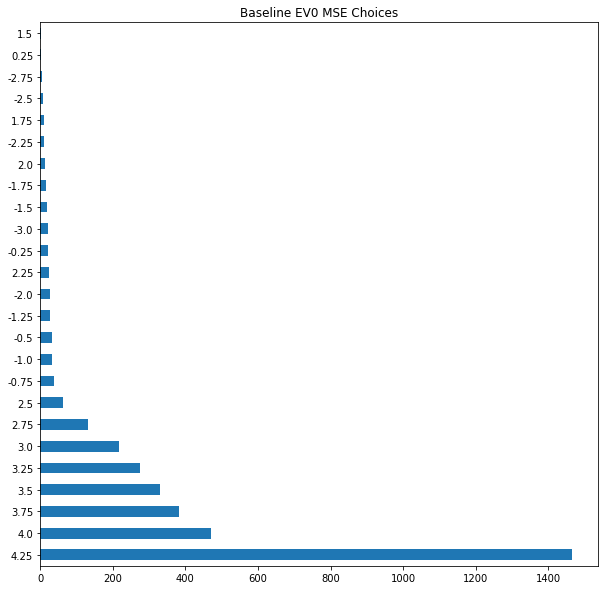

In [31]:
bmse_df = bdfg.get_group("mse").drop(columns="metric")
bmse_mins = bmse_df.pivot(columns="ev").idxmin(axis=1).apply(lambda f: f[1])
bmse_mins.value_counts().plot.barh(title="Baseline EV0 MSE Choices")

# plt.savefig(figdir / "baseline_mse_ev_corrected")

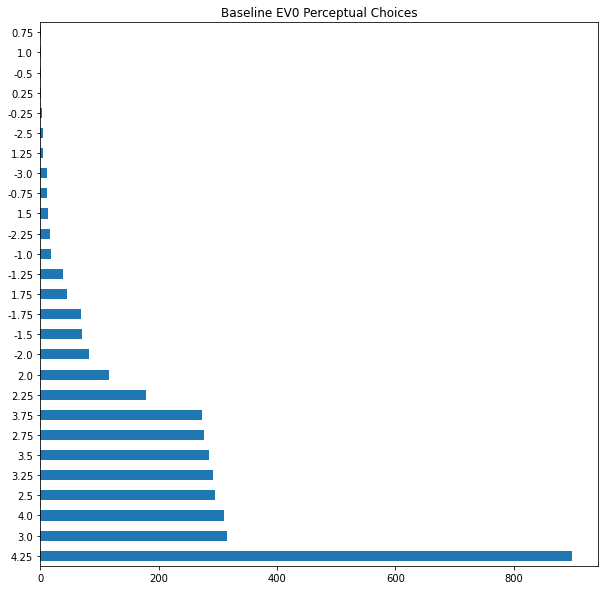

In [32]:
bperc_df = bdfg.get_group("perceptual").drop(columns="metric")
bperc_mins = bperc_df.pivot(columns="ev").idxmin(axis=1).apply(lambda f: f[1])
bperc_mins.value_counts().plot.barh(title="Baseline EV0 Perceptual Choices")

# plt.savefig(figdir / "baseline_perceptual_ev_corrected")

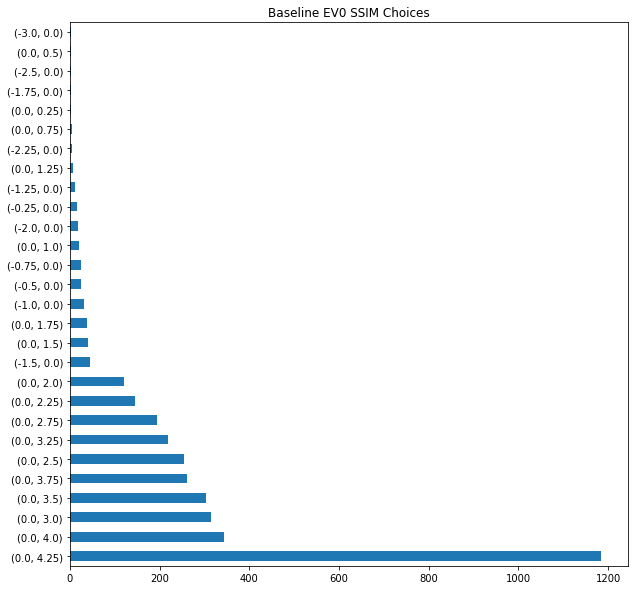

In [14]:
bssim_df = bdfg.get_group("ssim").drop(columns="metric").copy()
bssim_df["score"] = 1 - bssim_df["score"]
bssim_mins = bssim_df.pivot(columns="ev").idxmin(axis=1).apply(lambda f: f[1])
bssim_mins.value_counts().plot.barh(title="Baseline EV0 SSIM Choices")

# plt.savefig(figdir / "baseline_ssim_ev_corrected")

In [42]:
df[["ev1", "ev2"]].apply(lambda s:s.value_counts()).bar()

AttributeError: 'DataFrame' object has no attribute 'bar'

### Take a look at some of the best results for each metric

All Pairings First

Best according to MSE

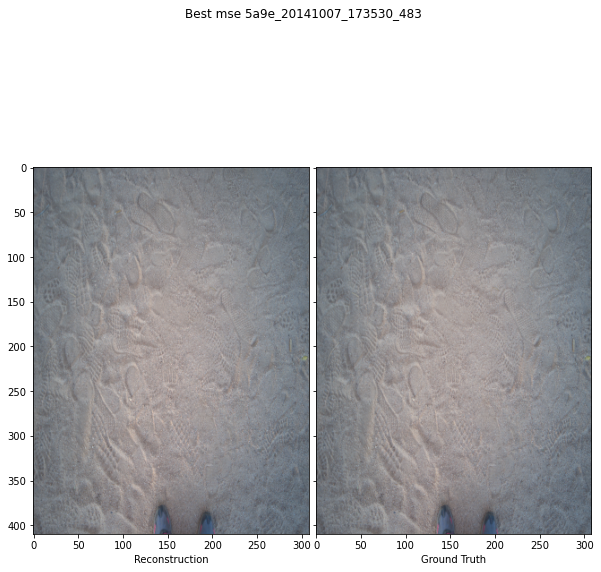

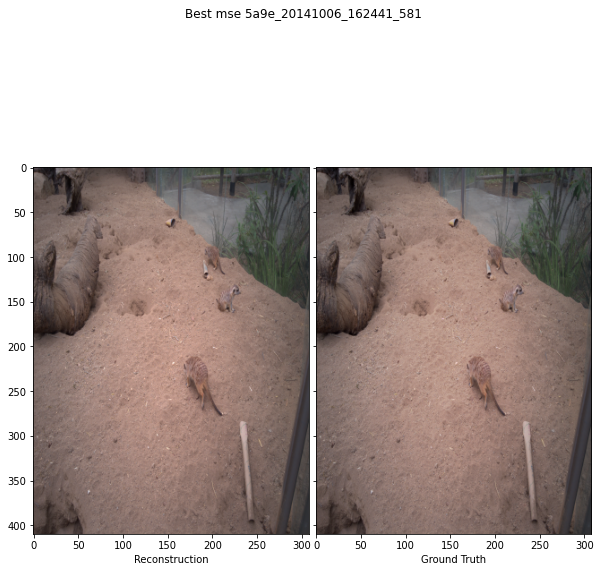

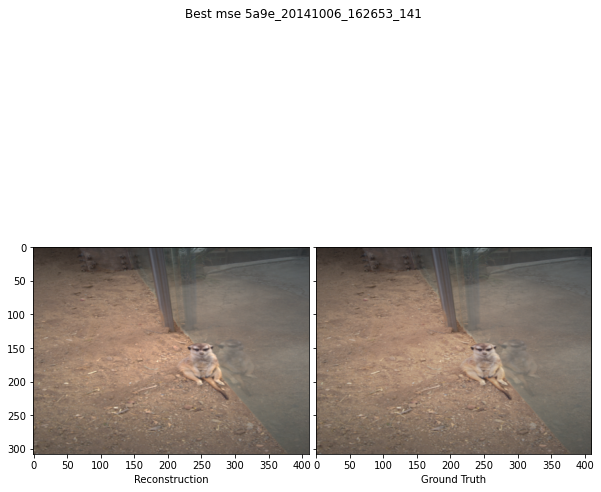

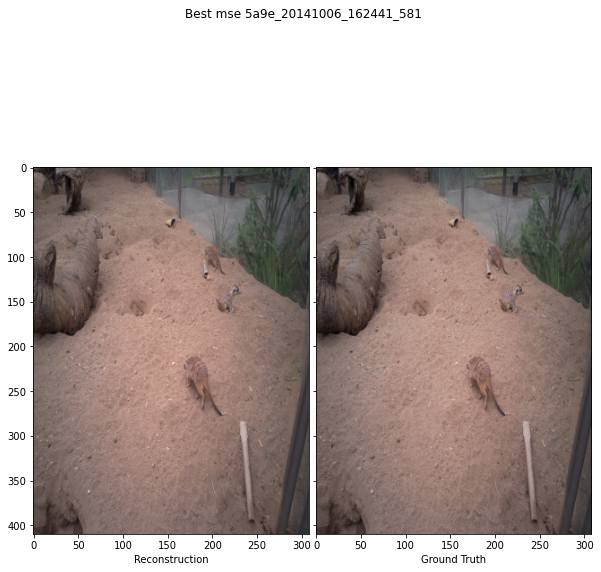

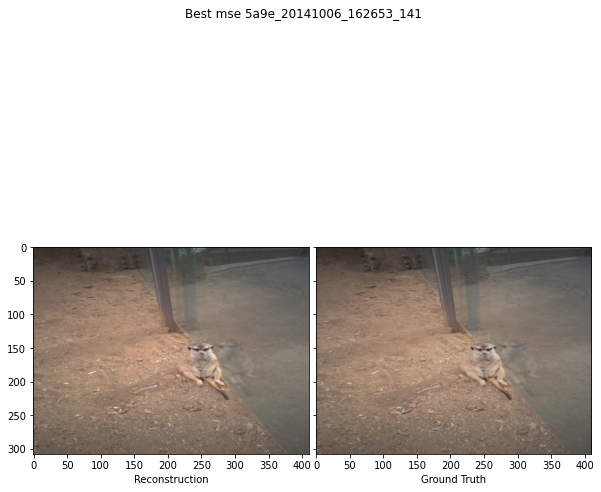

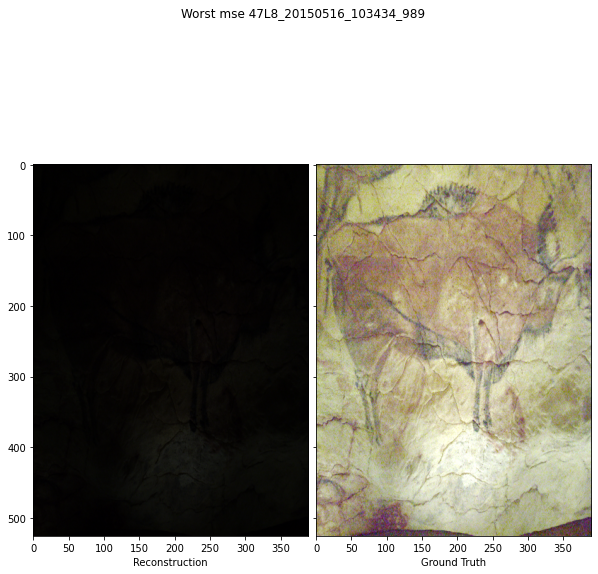

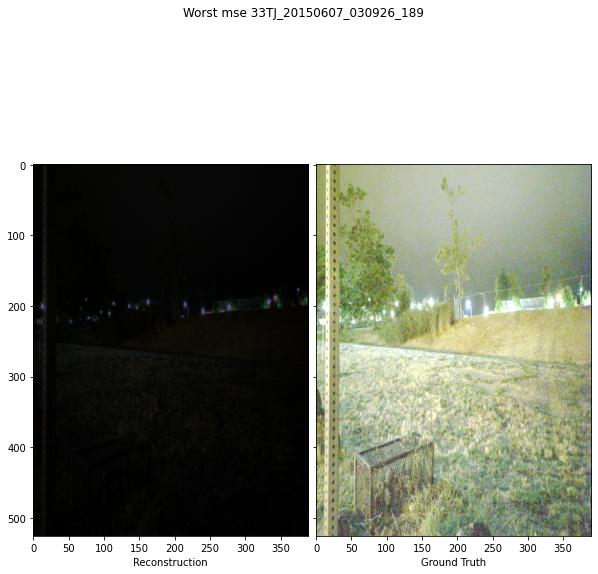

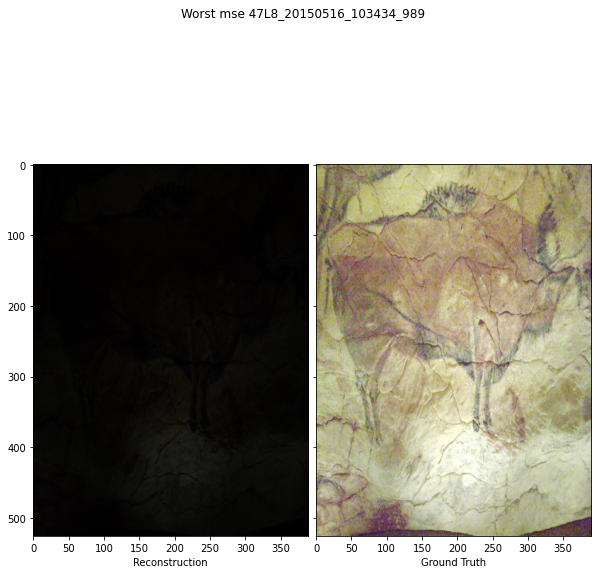

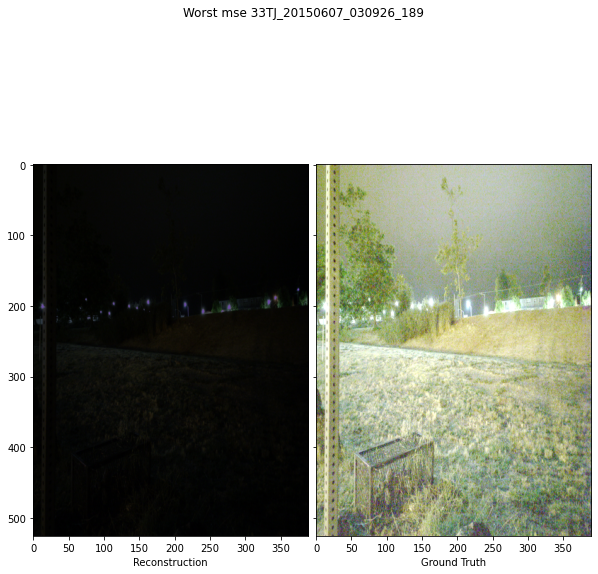

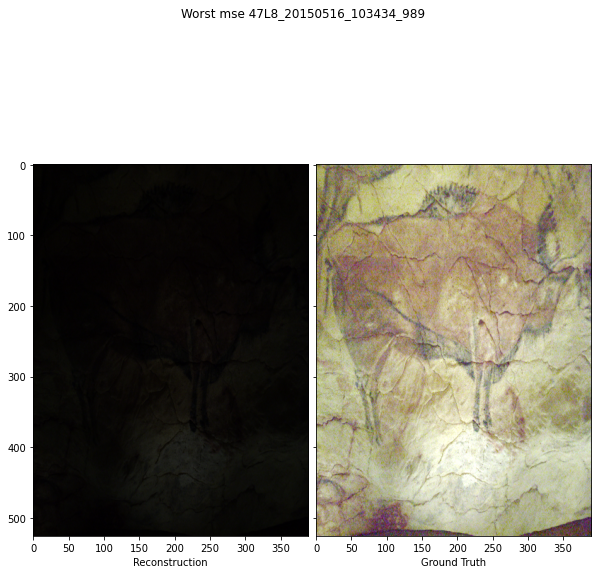

In [15]:
from dhdrnet.util import best_worse_metric

best_worse_metric(dfg, "mse", n=5)

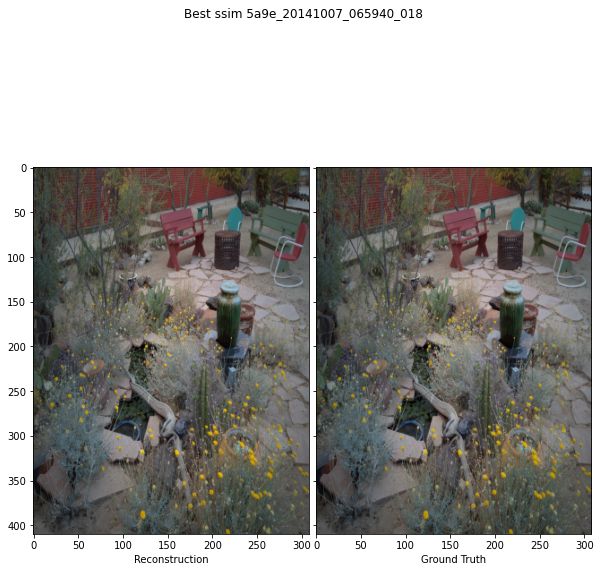

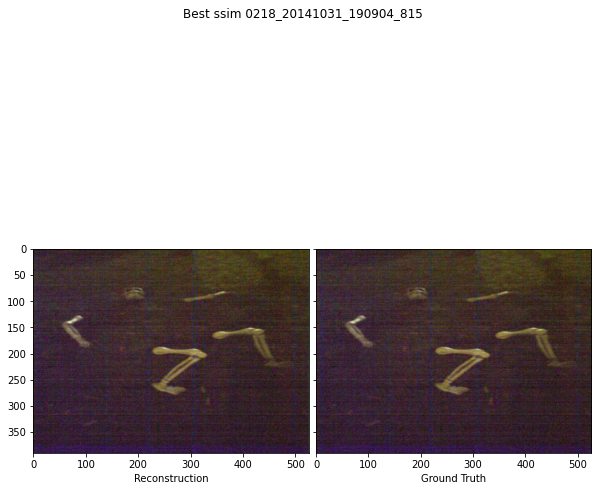

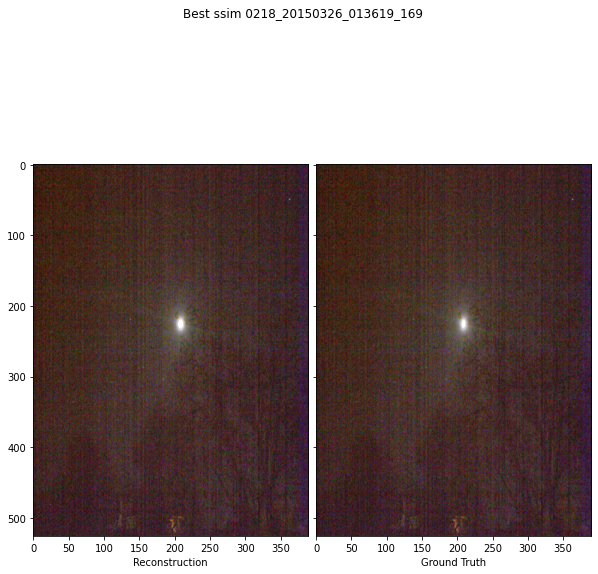

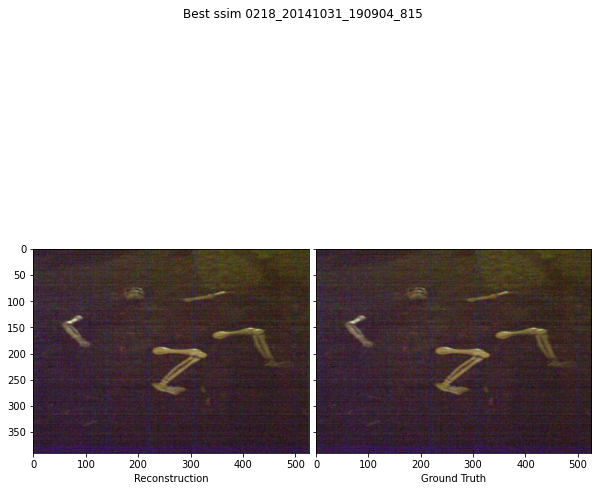

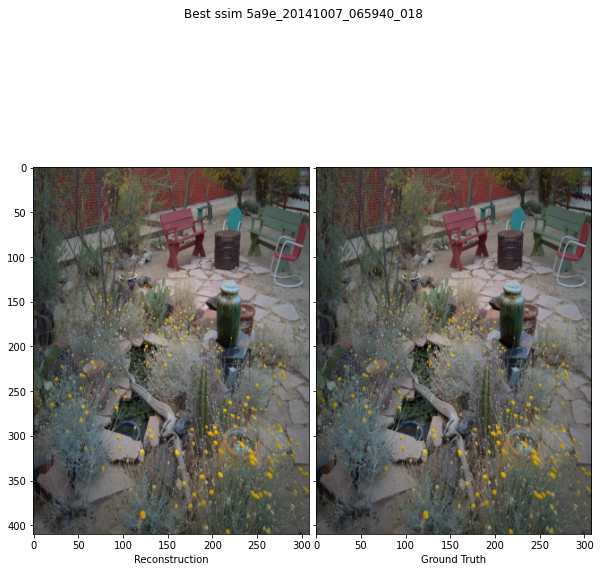

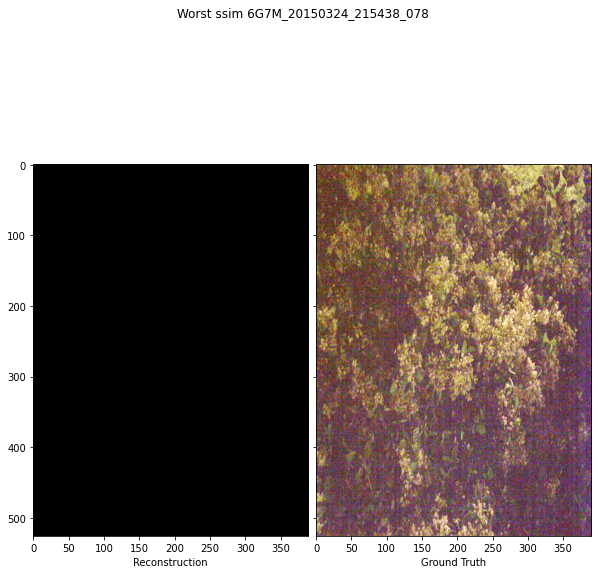

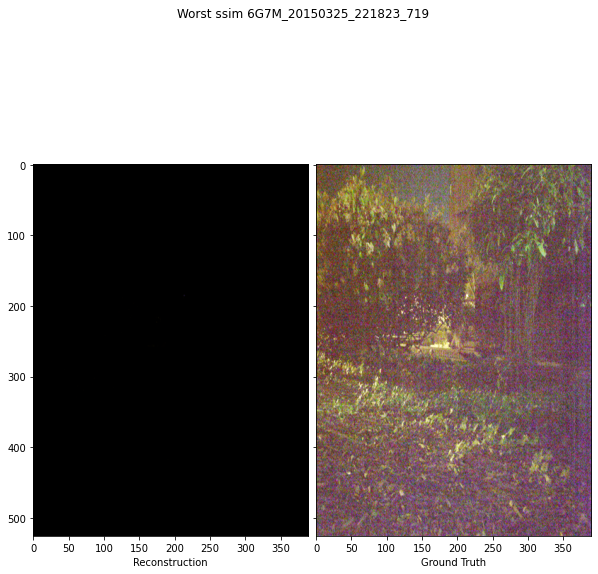

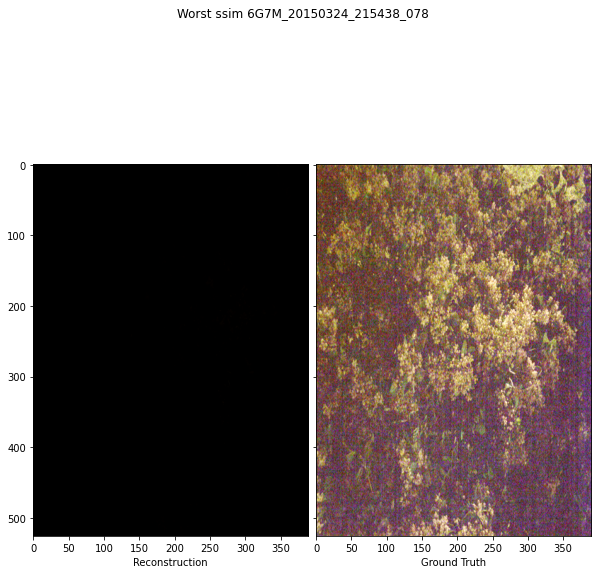

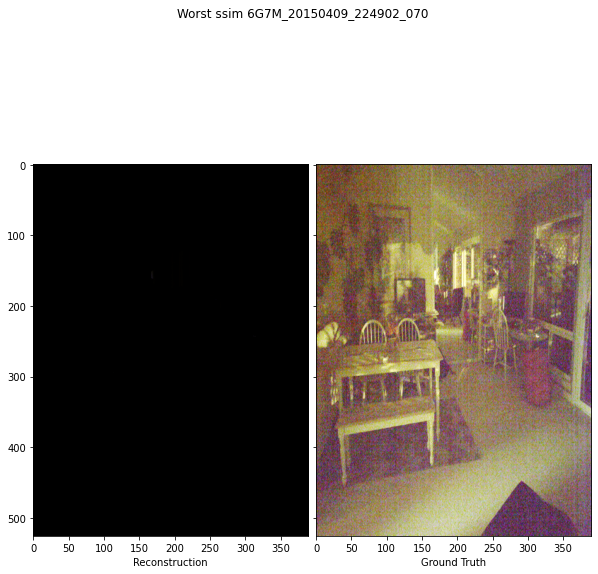

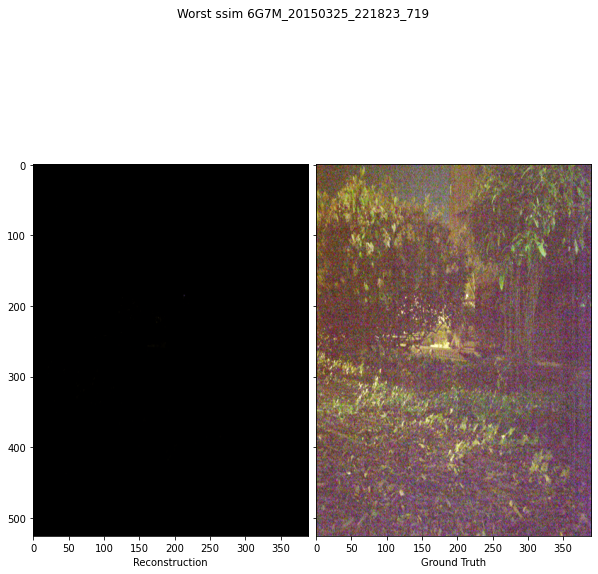

In [35]:
best_worse_metric(dfg, "ssim", n=5, save_path=figdir)

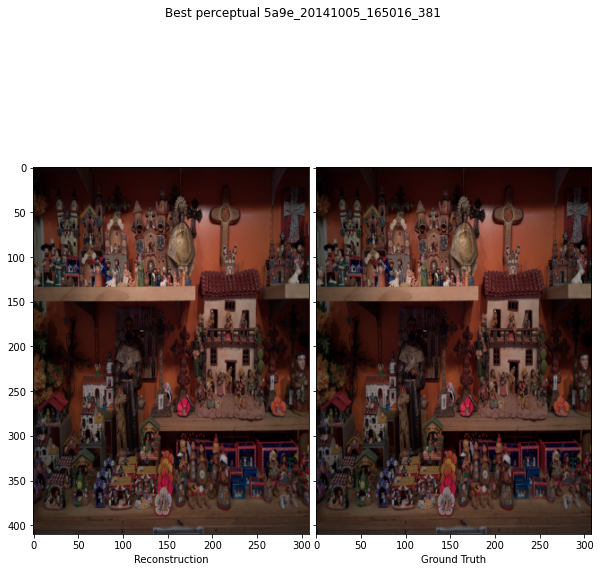

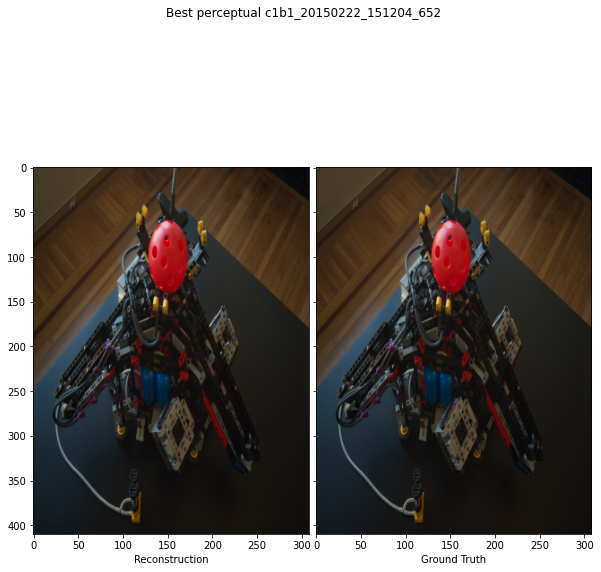

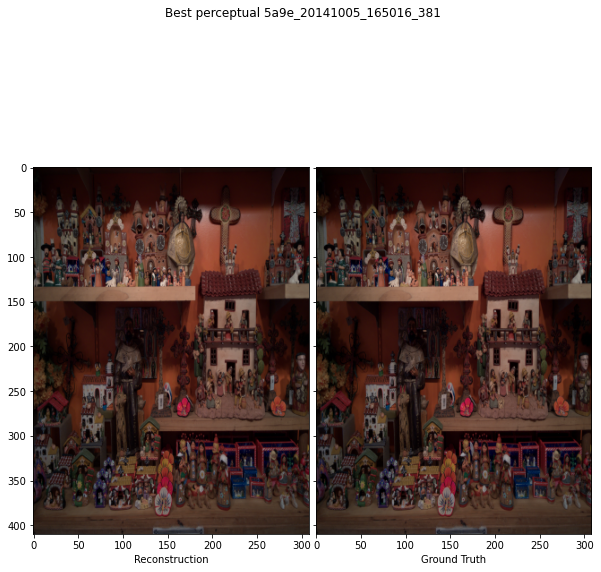

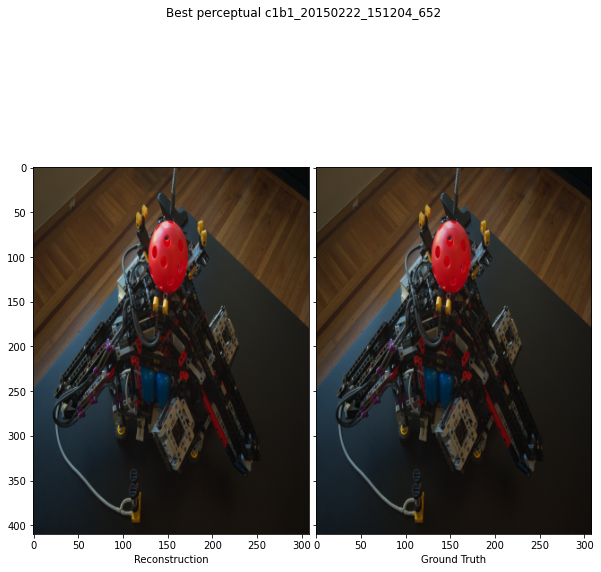

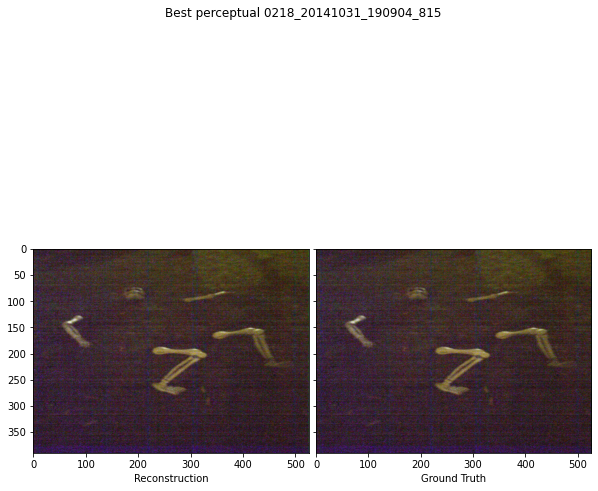

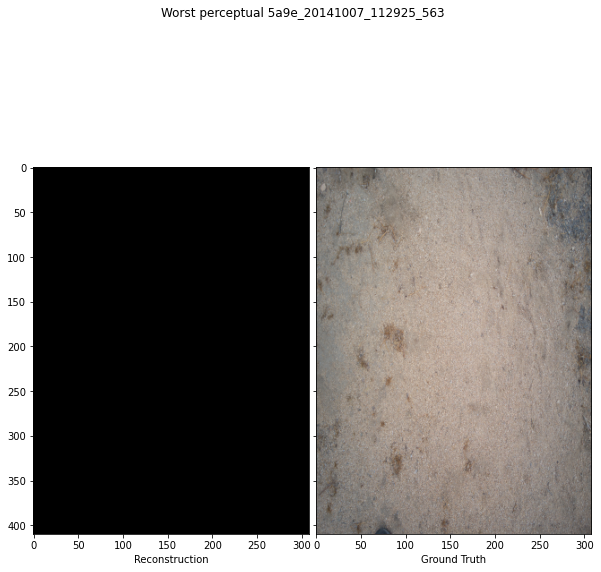

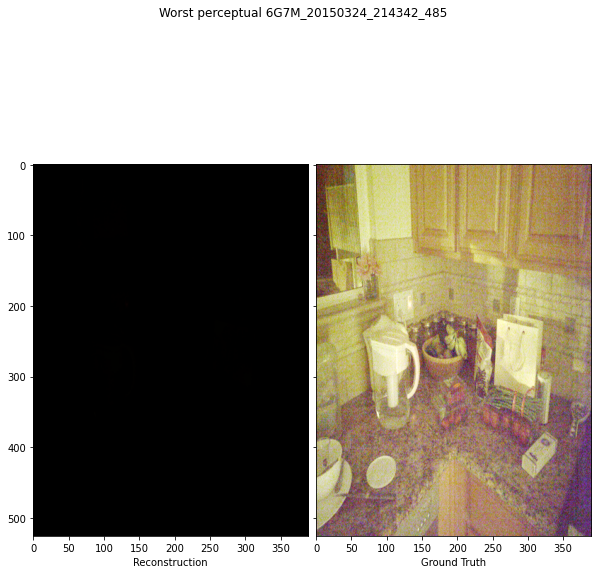

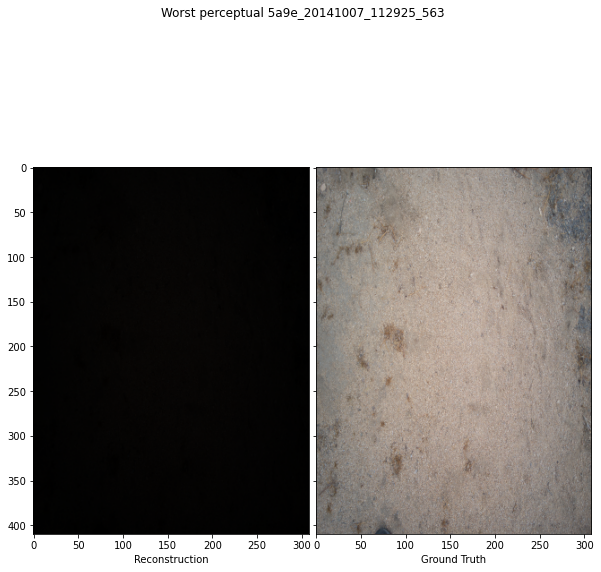

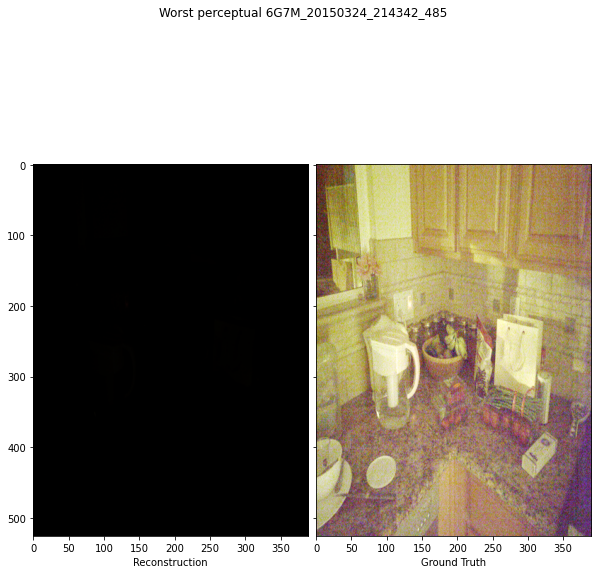

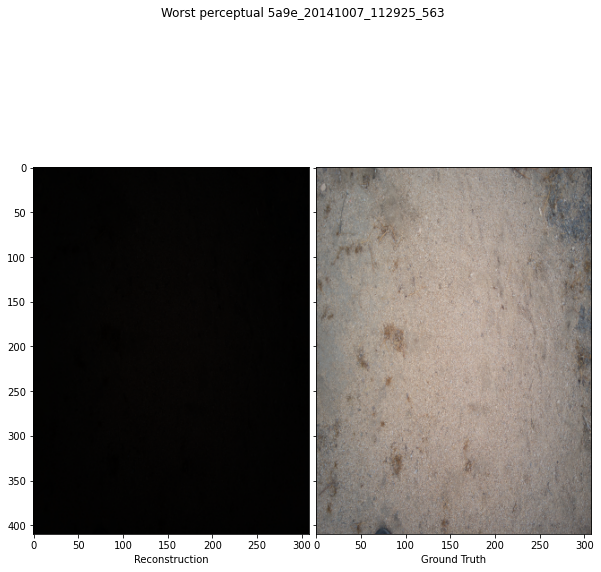

In [36]:
best_worse_metric(dfg, "perceptual", n=5, save_path=figdir)

In [19]:
best_worse_metric(bdfg)

,metric,score,ev
name,,,
0006_20160721_163256_525,mse,118.336332,"(-1.75, 0.75)"
0006_20160721_163256_525,mse,94.178451,"(-1.75, 1.0)"
0006_20160721_163256_525,mse,188.732894,"(-1.75, 0.5)"
0006_20160721_163256_525,mse,71.181608,"(-1.75, 1.5)"
0006_20160721_163256_525,mse,97.573232,"(-1.75, 1.75)"
...,...,...,...
synthetic_ramp_night_motion_blur,mse,447.170724,"(-1.75, 1.75)"
synthetic_ramp_night_motion_blur,mse,445.448438,"(-1.75, 1.5)"
synthetic_ramp_night_motion_blur,mse,535.291859,"(-1.75, 1.25)"


In [21]:
bdf

,metric,score,ev
name,,,
0006_20160721_163256_525,mse,634.889757,"(-1.75, 0.0)"
0006_20160721_163256_525,ssim,0.934373,"(-1.75, 0.0)"
0006_20160721_163256_525,perceptual,0.067679,"(-1.75, 0.0)"
0006_20160721_163256_525,mse,722.200191,"(-2.0, 0.0)"
0006_20160721_163256_525,ssim,0.930313,"(-2.0, 0.0)"
...,...,...,...
synthetic_ramp_night_motion_blur,ssim,0.732060,"(-2.0, 0.0)"
synthetic_ramp_night_motion_blur,mse,4991.714792,"(-2.0, 0.0)"
synthetic_ramp_night_motion_blur,perceptual,0.252432,"(-1.75, 0.0)"
